# **MIDTERM EXAMINATION**

Name:

*   IGNACIO, Maxyne Nuela
*   YURAG, Marivient Alexia R.

Year & Section: BS Computer Science - IS - 4B





# **Sample of Image Preprocessing with Resizing and Normalization**

This code reads an image, resizes it to a specified target size, normalizes the pixel values to the range [0, 1], and displays a side-by-side comparison of the original and preprocessed images.

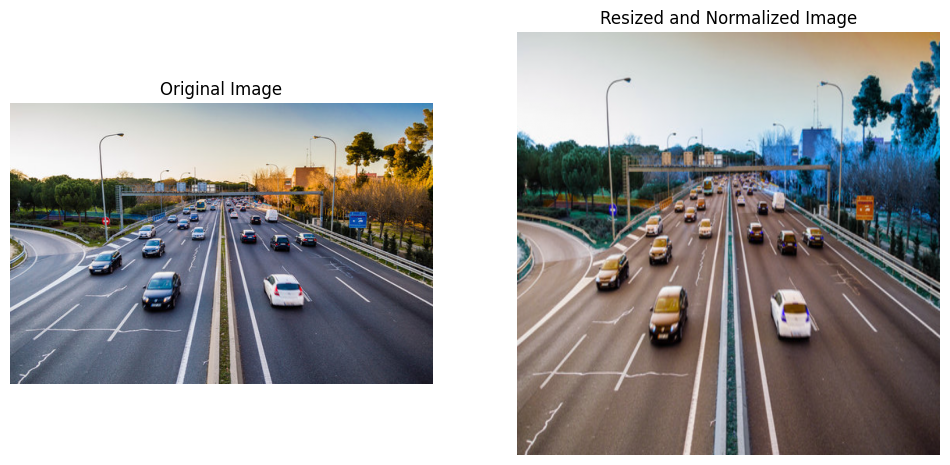

In [28]:
import cv2
import matplotlib.pyplot as plt

def resize_and_normalize(image_path, target_size=(640, 640)):
    # Read the image
    image = cv2.imread(image_path)

    # Resize the image to the target size
    image_resized = cv2.resize(image, target_size)

    # Normalize pixel values to range [0, 1]
    image_normalized = image_resized / 255.0  # Normalize to [0, 1]

    return image, image_normalized

# Example usage for one image
image_path = 'midtermi-img.jpg'
original_image, preprocessed_image = resize_and_normalize(image_path)

# Display the original and preprocessed images side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Show the original image
axs[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[0].set_title("Original Image")

# Show the resized and normalized image
axs[1].imshow(preprocessed_image)
axs[1].axis('off')
axs[1].set_title("Resized and Normalized Image")

plt.show()


# **Install and Verify Ultralytics YOLO Setup**

 Installs the Ultralytics YOLO package and performs system checks to ensure compatibility and readiness for running YOLO models.

In [1]:
!pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.7/112.6 GB disk)


# **YOLO11n Image Inference**

Runs YOLO11n on an image to detect and label objects from a specified online source.

In [2]:
# Run inference on an image with YOLO11n
!yolo predict model=yolo11n.pt source='https://ultralytics.com/images/zidane.jpg'

100% 5.35M/5.35M [00:00<00:00, 217MB/s]
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

100% 49.2k/49.2k [00:00<00:00, 37.0MB/s]
image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 62.7ms
Speed: 11.0ms preprocess, 62.7ms inference, 698.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


# **Download and Extract COCO Validation Dataset**

Downloads the COCO 2017 validation dataset (5,000 images) as a zip file, extracts it into the datasets directory, and removes the temporary zip file to save storage.


In [3]:
# Download COCO val
import torch
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')  # download (780M - 5000 images)
!unzip -q tmp.zip -d datasets && rm tmp.zip  # unzip

100%|██████████| 780M/780M [00:23<00:00, 35.2MB/s]


# **Validate YOLO11n on COCO8 Validation Set**

Validates the YOLO11n model on the COCO8 validation dataset using the provided coco8.yaml configuration file to evaluate its performance

In [4]:
# Validate YOLO11n on COCO8 val
!yolo val model=yolo11n.pt data=coco8.yaml

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

Dataset 'coco8.yaml' images not found ⚠️, missing path '/content/datasets/coco8/images/val'
100% 433k/433k [00:00<00:00, 88.5MB/s]
Unzipping /content/datasets/coco8.zip to /content/datasets/coco8...: 100% 25/25 [00:00<00:00, 4804.25file/s]
Dataset download success ✅ (1.7s), saved to /content/datasets

100% 755k/755k [00:00<00:00, 106MB/s]
val: Scanning /content/datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100% 4/4 [00:00<00:00, 75.81it/s]
val: New cache created: /content/datasets/coco8/labels/val.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:02<00:00,  2.04s/it]
                   all          4         17       0.57       0.85      0.847      0.632
                person          3         10      0.557        0.6      0.585      0.272
    

# **Select YOLO11 Logger for Training**

This code allows the user to choose between Comet or TensorBoard for logging YOLO11 training metrics, initializing the respective logger and displaying training progress accordingly.

In [5]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

<IPython.core.display.Javascript object>

# **Train YOLO11n on COCO8 for 3 Epochs**

Trains the YOLO11n model on the COCO8 dataset for 3 epochs with an image size of 640 to fine-tune the model for object detection tasks.

In [6]:
# Train YOLO11n on COCO8 for 3 epochs
!yolo train model=yolo11n.pt data=coco8.yaml epochs=3 imgsz=640

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=coco8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width

# **YOLO11n Model Workflow**

This code demonstrates various steps using the YOLO11n model, including loading a pretrained model, training on the COCO8 dataset, evaluating performance, running inference on an image, and exporting the model to ONNX format.

In [7]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolo11n.yaml')  # build a new model from scratch
model = YOLO('yolo11n.pt')  # load a pretrained model (recommended for training)

# Use the model
results = model.train(data='coco8.yaml', epochs=3)  # train the model
results = model.val()  # evaluate model performance on the validation set
results = model('https://ultralytics.com/images/bus.jpg')  # predict on an image
results = model.export(format='onnx')  # export the model to ONNX format

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=coco8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/datasets/coco8/labels/train.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3     0.719G     0.9751      3.255      1.348         30        640: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all          4         17      0.578       0.85      0.849      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3     0.715G       1.31      4.043      1.603         35        640: 100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          4         17      0.579       0.85      0.851      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3     0.692G      1.134      3.174      1.599         18        640: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

                   all          4         17      0.579       0.85      0.855      0.619



3 epochs completed in 0.003 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.38it/s]


                   all          4         17      0.577       0.85      0.849      0.631
                person          3         10       0.57        0.6      0.594      0.266
                   dog          1          1      0.546          1      0.995      0.697
                 horse          1          2      0.563          1      0.995      0.674
              elephant          1          2      0.365        0.5       0.52      0.258
              umbrella          1          1      0.568          1      0.995      0.995
          potted plant          1          1      0.848          1      0.995      0.895
Speed: 0.4ms preprocess, 5.0ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


val: Scanning /content/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]


                   all          4         17      0.577       0.85      0.878      0.635
                person          3         10       0.57        0.6      0.594      0.274
                   dog          1          1      0.546          1      0.995      0.697
                 horse          1          2      0.563          1      0.995      0.674
              elephant          1          2      0.366        0.5      0.695      0.275
              umbrella          1          1      0.568          1      0.995      0.995
          potted plant          1          1      0.848          1      0.995      0.895
Speed: 6.2ms preprocess, 32.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train22



100%|██████████| 134k/134k [00:00<00:00, 38.0MB/s]

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 61.9ms
Speed: 3.8ms preprocess, 61.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (5.3 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 115.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 195.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 MB 64.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 137.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 104.3 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 22.3s, installed 3 packages: ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: sli

# **Train and Predict with YOLO11n on COCO128**

This code loads the pretrained YOLO11n model, trains it on the COCO128 dataset for 3 epochs, and performs object detection on an image of a bus from a provided URL.

In [8]:
# Load YOLO11n, train it on COCO128 for 3 epochs and predict an image with it
from ultralytics import YOLO

model = YOLO('yolo11n.pt')  # load a pretrained YOLO detection model
model.train(data='coco8.yaml', epochs=3)  # train the model
model('https://ultralytics.com/images/bus.jpg')  # predict on an image

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=coco8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/datasets/coco8/labels/train.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3     0.734G     0.9751      3.255      1.348         30        640: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]

                   all          4         17      0.578       0.85      0.849      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3     0.713G       1.31      4.043      1.603         35        640: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all          4         17      0.579       0.85      0.851      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3     0.703G      1.134      3.174      1.599         18        640: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.97it/s]

                   all          4         17      0.579       0.85      0.855      0.619



3 epochs completed in 0.002 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]


                   all          4         17      0.577       0.85      0.849      0.631
                person          3         10       0.57        0.6      0.594      0.266
                   dog          1          1      0.546          1      0.995      0.697
                 horse          1          2      0.563          1      0.995      0.674
              elephant          1          2      0.365        0.5       0.52      0.258
              umbrella          1          1      0.568          1      0.995      0.995
          potted plant          1          1      0.848          1      0.995      0.895
Speed: 0.6ms preprocess, 4.8ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train3

Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

# **Train and Predict with YOLO11n-seg on COCO128-seg**

This code loads the pretrained YOLO11n-seg model, trains it on the COCO128-seg dataset for 3 epochs, and performs image segmentation on an image of a bus from a provided URL.

In [9]:
# Load YOLO11n-seg, train it on COCO128-seg for 3 epochs and predict an image with it
from ultralytics import YOLO

model = YOLO('yolo11n-seg.pt')  # load a pretrained YOLO segmentation model
model.train(data='coco8-seg.yaml', epochs=3)  # train the model
model('https://ultralytics.com/images/bus.jpg')  # predict on an image

100%|██████████| 5.90M/5.90M [00:00<00:00, 243MB/s]

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=coco8-seg.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l


Dataset 'coco8-seg.yaml' images not found ⚠️, missing path '/content/datasets/coco8-seg/images/val'


100%|██████████| 439k/439k [00:00<00:00, 64.6MB/s]
Unzipping /content/datasets/coco8-seg.zip to /content/datasets/coco8-seg...: 100%|██████████| 25/25 [00:00<00:00, 3420.35file/s]

Dataset download success ✅ (2.7s), saved to /content/datasets


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1 

YOLO11n-seg summary: 355 layers, 2,876,848 parameters, 2,876,832 gradients, 10.5 GFLOPs

Transferred 561/561 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/segment/train', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/datasets/coco8-seg/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 2087.50it/s]

train: New cache created: /content/datasets/coco8-seg/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/coco8-seg/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1369.57it/s]

val: New cache created: /content/datasets/coco8-seg/labels/val.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        1/3      1.04G      1.025      2.654      3.376      1.316         30        640: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all          4         17      0.781      0.892      0.939      0.668      0.723      0.833      0.822      0.562



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        2/3     0.975G      1.318      4.189      3.927      1.595         36        640: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]

                   all          4         17      0.778      0.899      0.941      0.669      0.718      0.838      0.822      0.563



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        3/3     0.893G     0.7148      2.326      2.377      1.172         17        640: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

                   all          4         17      0.778      0.903      0.941      0.671      0.714      0.839      0.822      0.562



3 epochs completed in 0.009 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.1MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.1MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,868,664 parameters, 0 gradients, 10.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.57it/s]


                   all          4         17      0.779      0.903       0.94       0.67      0.715      0.839      0.822      0.562
                person          3         10      0.727      0.535      0.668      0.314      0.727      0.535      0.617      0.255
                   dog          1          1      0.735          1      0.995      0.895      0.735          1      0.995      0.895
                 horse          1          2      0.619          1      0.995      0.581      0.619          1      0.828      0.183
              elephant          1          2          1      0.883      0.995      0.341      0.617        0.5        0.5       0.25
              umbrella          1          1      0.667          1      0.995      0.995      0.667          1      0.995      0.895
          potted plant          1          1      0.927          1      0.995      0.895      0.927          1      0.995      0.895
Speed: 0.3ms preprocess, 6.0ms inference, 0.0ms loss, 1.5ms postproce

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 

# **Train and Predict with YOLO11n-cls on MNIST160**

This code loads the pretrained YOLO11n-cls classification model, trains it on the MNIST160 dataset for 3 epochs, and performs image classification on an image of a bus from a provided URL.

In [10]:
# Load YOLO11n-cls, train it on mnist160 for 3 epochs and predict an image with it
from ultralytics import YOLO

model = YOLO('yolo11n-cls.pt')  # load a pretrained YOLO classification model
model.train(data='mnist160', epochs=3)  # train the model
model('https://ultralytics.com/images/bus.jpg')  # predict on an image

100%|██████████| 5.52M/5.52M [00:00<00:00, 181MB/s]

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=classify, mode=train, model=yolo11n-cls.pt, data=mnist160, epochs=3, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w


100%|██████████| 70.0k/70.0k [00:00<00:00, 43.1MB/s]
Unzipping /content/datasets/mnist160.zip to /content/datasets/mnist160...: 100%|██████████| 184/184 [00:00<00:00, 7961.46file/s]

Dataset download success ✅ (2.0s), saved to /content/datasets/mnist160

train: /content/datasets/mnist160/train... found 80 images in 10 classes ✅ 
val: None...
test: /content/datasets/mnist160/test... found 80 images in 10 classes ✅ 
Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ult

Transferred 234/236 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/classify/train', view at http://localhost:6006/
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/datasets/mnist160/train... 80 images, 0 corrupt: 100%|██████████| 80/80 [00:00<00:00, 4169.13it/s]

train: New cache created: /content/datasets/mnist160/train.cache



val: Scanning /content/datasets/mnist160/test... 80 images, 0 corrupt: 100%|██████████| 80/80 [00:00<00:00, 2400.38it/s]

val: New cache created: /content/datasets/mnist160/test.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/classify/train
Starting training for 3 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:00<00:00, 22.82it/s]

                   all        0.1      0.488



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:00<00:00, 15.14it/s]

                   all      0.138        0.5



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:00<00:00, 19.77it/s]

                   all       0.05      0.538



3 epochs completed in 0.008 hours.
Optimizer stripped from runs/classify/train/weights/last.pt, 3.2MB
Optimizer stripped from runs/classify/train/weights/best.pt, 3.2MB

Validating runs/classify/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-cls summary (fused): 112 layers, 1,538,834 parameters, 0 gradients, 3.2 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/datasets/mnist160/train... found 80 images in 10 classes ✅ 
val: None...
test: /content/datasets/mnist160/test... found 80 images in 10 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:00<00:00, 23.28it/s]


                   all      0.138      0.512
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train

Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 224x224 6 0.34, 9 0.11, 8 0.11, 4 0.09, 2 0.08, 4.6ms
Speed: 10.1ms preprocess, 4.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9'}
 obb: None
 orig_img: array([[[119, 146, 172],
         [121, 148, 174],
         [122, 152, 177],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[120, 147, 173],
         [122, 149, 175],
         [123, 153, 178],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[123, 150, 176],
         [124, 151, 177],
         [125, 155, 180],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        ...,
 
        [[183, 182, 186],
         [179, 178, 182],
         [180, 179, 183],
         ...,
         [121, 111, 117],
         [113, 103, 109],
         [115, 105, 111]],
 
        [[165, 164, 168],
         [173, 172, 176],
         [187, 186, 190],


# **Train and Predict with YOLO11n-pose on COCO8-pose**

This code loads the pretrained YOLO11n-pose model, trains it on the COCO8-pose dataset for 3 epochs, and performs pose estimation on an image of a bus from a provided URL.

In [11]:
# Load YOLO11n-pose, train it on COCO8-pose for 3 epochs and predict an image with it
from ultralytics import YOLO

model = YOLO('yolo11n-pose.pt')  # load a pretrained YOLO pose model
model.train(data='coco8-pose.yaml', epochs=3)  # train the model
model('https://ultralytics.com/images/bus.jpg')  # predict on an image

100%|██████████| 5.97M/5.97M [00:00<00:00, 342MB/s]

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=yolo11n-pose.pt, data=coco8-pose.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, li


100%|██████████| 334k/334k [00:00<00:00, 54.8MB/s]
Unzipping /content/datasets/coco8-pose.zip to /content/datasets/coco8-pose...: 100%|██████████| 27/27 [00:00<00:00, 4212.87file/s]

Dataset download success ✅ (0.9s), saved to /content/datasets

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, Tru

YOLO11n-pose summary: 344 layers, 2,874,462 parameters, 2,874,446 gradients, 7.5 GFLOPs

Transferred 541/541 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/pose/train', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/datasets/coco8-pose/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 3083.48it/s]

train: New cache created: /content/datasets/coco8-pose/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/coco8-pose/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 372.93it/s]

val: New cache created: /content/datasets/coco8-pose/labels/val.cache


Plotting labels to runs/pose/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        1/3     0.732G      1.154      3.011      0.301     0.7083       1.34          9        640: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all          4         14      0.807      0.898      0.913      0.712          1      0.693      0.722      0.371



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        2/3     0.682G      1.301       4.79     0.2194      1.075      1.521         11        640: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]

                   all          4         14      0.816      0.857      0.907      0.705      0.985      0.643      0.716      0.351



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        3/3     0.679G      1.083      3.322     0.3808     0.8199      1.725          9        640: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all          4         14      0.818      0.857      0.907      0.706      0.986      0.643      0.763      0.361



3 epochs completed in 0.008 hours.
Optimizer stripped from runs/pose/train/weights/last.pt, 6.1MB
Optimizer stripped from runs/pose/train/weights/best.pt, 6.1MB

Validating runs/pose/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-pose summary (fused): 257 layers, 2,866,468 parameters, 0 gradients, 7.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.26it/s]


                   all          4         14      0.807      0.899      0.913      0.712          1      0.694      0.722      0.362
Speed: 0.3ms preprocess, 5.3ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/pose/train

Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 25.6ms
Speed: 3.6ms preprocess, 25.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: ultralytics.engine.results.Keypoints object
 masks: None
 names: {0: 'person'}
 obb: None
 orig_img: array([[[119, 146, 172],
         [121, 148, 174],
         [122, 152, 177],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[120, 147, 173],
         [122, 149, 175],
         [123, 153, 178],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[123, 150, 176],
         [124, 151, 177],
         [125, 155, 180],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        ...,
 
        [[183, 182, 186],
         [179, 178, 182],
         [180, 179, 183],
         ...,
         [121, 111, 117],
         [113, 103, 109],
         [115, 105, 111]],
 
        [[165, 164, 168],
         [173, 172, 176],
         [187, 186,

# **Train and Predict with YOLO11n-obb on DOTA8**

This code loads the pretrained YOLO11n-obb model, trains it on the DOTA8 dataset for 3 epochs, and performs object detection with oriented bounding boxes (OBB) on an image of a bus from a provided URL.


In [12]:
# Load YOLO11n-obb, train it on DOTA8 for 3 epochs and predict an image with it
from ultralytics import YOLO

model = YOLO('yolo11n-obb.pt')  # load a pretrained YOLO OBB model
model.train(data='dota8.yaml', epochs=3)  # train the model
model('https://ultralytics.com/images/bus.jpg')  # predict on an image

100%|██████████| 5.53M/5.53M [00:00<00:00, 183MB/s]

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolo11n-obb.pt, data=dota8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid


100%|██████████| 1.24M/1.24M [00:00<00:00, 184MB/s]
Unzipping /content/datasets/dota8.zip to /content/datasets/dota8...: 100%|██████████| 27/27 [00:00<00:00, 1576.26file/s]

Dataset download success ✅ (2.5s), saved to /content/datasets

Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, Tr

YOLO11n-obb summary: 344 layers, 2,664,432 parameters, 2,664,416 gradients, 6.7 GFLOPs

Transferred 541/541 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/obb/train', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/datasets/dota8/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1222.29it/s]

train: New cache created: /content/datasets/dota8/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/dota8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 19831.22it/s]

val: New cache created: /content/datasets/dota8/labels/val.cache


Plotting labels to runs/obb/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/obb/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      1.69G     0.8841     0.5575      1.766        156       1024: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all          4          8      0.944          1      0.995      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      1.72G     0.9257     0.5699      1.793        232       1024: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

                   all          4          8      0.946          1      0.995      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      1.63G     0.8021     0.4981      1.577         68       1024: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all          4          8      0.943          1      0.995      0.804



3 epochs completed in 0.010 hours.
Optimizer stripped from runs/obb/train/weights/last.pt, 5.9MB
Optimizer stripped from runs/obb/train/weights/best.pt, 5.9MB

Validating runs/obb/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-obb summary (fused): 257 layers, 2,656,648 parameters, 0 gradients, 6.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]


                   all          4          8      0.943          1      0.995      0.804
      baseball diamond          3          4      0.895          1      0.995      0.851
      basketball court          1          3      0.971          1      0.995      0.866
     soccer ball field          1          1      0.964          1      0.995      0.697
Speed: 0.6ms preprocess, 12.9ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to runs/obb/train

Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 1024x768 56.3ms
Speed: 4.4ms preprocess, 56.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 768)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'plane', 1: 'ship', 2: 'storage tank', 3: 'baseball diamond', 4: 'tennis court', 5: 'basketball court', 6: 'ground track field', 7: 'harbor', 8: 'bridge', 9: 'large vehicle', 10: 'small vehicle', 11: 'helicopter', 12: 'roundabout', 13: 'soccer ball field', 14: 'swimming pool'}
 obb: ultralytics.engine.results.OBB object
 orig_img: array([[[119, 146, 172],
         [121, 148, 174],
         [122, 152, 177],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[120, 147, 173],
         [122, 149, 175],
         [123, 153, 178],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        [[123, 150, 176],
         [124, 151, 177],
         [125, 155, 180],
         ...,
         [161, 171, 188],
         [160, 170, 187],
         [160, 170, 187]],
 
        ...,
 
        [[183, 18

# **YOLO11n Evaluation on COCO8**

This code validates the performance of a YOLO11n model trained on the COCO8 dataset and reports key metrics such as precision, recall, and mAP.

In [14]:
from ultralytics import YOLO

# Set paths
model_path = '/content/yolo11n.pt'  # Path to your trained model
data_config = '/content/coco8.yaml'  # Path for COCO dataset configuration

# Load the model
model = YOLO(model_path)

# Run validation and capture metrics
print("Running validation...")
metrics = model.val(data=data_config)  # Evaluates on the dataset defined in coco8.yaml

# Extract evaluation metrics using results_dict
try:
    # Extracting and printing the results_dict
    results_dict = metrics.results_dict

    # Print all available keys in the results_dict
    print("Available keys in the results_dict:")
    print(results_dict.keys())

    # Accessing the correct keys for precision, recall, mAP, and fitness (accuracy)
    precision = results_dict['metrics/precision(B)'] * 100  # In percentage
    recall = results_dict['metrics/recall(B)'] * 100        # In percentage
    map50 = results_dict['metrics/mAP50(B)'] * 100           # mAP at IoU 0.5 in percentage
    map50_95 = results_dict['metrics/mAP50-95(B)'] * 100     # mAP from IoU 0.5 to 0.95 in percentage
    accuracy = results_dict['fitness'] * 100                 # Overall accuracy as fitness, in percentage

    # Print the evaluation metrics
    print("\nEvaluation Metrics Report:")
    print(f"Mean Precision: {precision:.2f}%")
    print(f"Mean Recall: {recall:.2f}%")
    print(f"Mean Average Precision (mAP) @ IoU 50: {map50:.2f}%")
    print(f"Mean Average Precision (mAP) @ IoU 50-95: {map50_95:.2f}%")
    print(f"Accuracy (Fitness): {accuracy:.2f}%")

except AttributeError as e:
    print("Error: Unable to retrieve some metrics. Please check the attribute names.")
    print(e)


Running validation...
Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


val: Scanning /content/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]


                   all          4         17       0.57       0.85      0.847      0.632
                person          3         10      0.557        0.6      0.585      0.272
                   dog          1          1      0.548          1      0.995      0.697
                 horse          1          2      0.531          1      0.995      0.674
              elephant          1          2      0.371        0.5      0.516      0.256
              umbrella          1          1      0.569          1      0.995      0.995
          potted plant          1          1      0.847          1      0.995      0.895
Speed: 3.6ms preprocess, 22.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val3
Available keys in the results_dict:
dict_keys(['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'fitness'])

Evaluation Metrics Report:
Mean Precision: 57.05%
Mean Recall: 85.00%
Mean Average Precision (mAP) @ IoU 50: 84.

# **Install Ultralytics from GitHub**

 This command installs the most up-to-date version of the Ultralytics package by fetching it directly from the GitHub source.

In [15]:
# Pip install from source
!pip install git+https://github.com/ultralytics/ultralytics@main

  Cloning https://github.com/ultralytics/ultralytics (to revision main) to /tmp/pip-req-build-3nug77gq
  Running command git clone --filter=blob:none --quiet https://github.com/ultralytics/ultralytics /tmp/pip-req-build-3nug77gq
  Resolved https://github.com/ultralytics/ultralytics to commit 84bfe3c2e4fd5881c33d0f1264b94c6e62edeb43
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


# **Clone Ultralytics Repository and Install Dependencies**

This command clones the latest version of the Ultralytics repository from GitHub's main branch and installs the library with its dependencies.

In [16]:
# Git clone and run tests on updates branch
!git clone https://github.com/ultralytics/ultralytics -b main
%pip install -qe ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 45618, done.
remote: Counting objects: 100% (1001/1001), done.
remote: Compressing objects: 100% (618/618), done.
remote: Total 45618 (delta 681), reused 613 (delta 375), pack-reused 44617 (from 1)
Receiving objects: 100% (45618/45618), 38.25 MiB | 17.17 MiB/s, done.
Resolving deltas: 100% (33901/33901), done.
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done


# **Run Tests on Ultralytics Repository**

this command runs the test suite located in the ultralytics/tests directory to ensure that the repository's code functions correctly.

In [17]:
# Run tests (Git clone only)
!pytest ultralytics/tests

======================================= test session starts ========================================
platform linux -- Python 3.10.12, pytest-7.4.4, pluggy-1.5.0
rootdir: /content/ultralytics
configfile: pyproject.toml
plugins: typeguard-4.4.0, anyio-3.7.1
collected 258 items                                                                                

ultralytics/tests/test_cli.py ........................                                       [ 24%]
ultralytics/tests/test_cuda.py FFFFF                                                         [ 29%]
ultralytics/tests/test_engine.py .....                                                       [ 35%]
ultralytics/tests/test_exports.py .....ss                                                    [ 42%]
ultralytics/tests/test_integrations.py ssss.                                                 [ 47%]
ultralytics/tests/test_python.py ....ss.............................................         [100%]

=========================================

# **Object Detection on Four Images with YOLO**

This script runs YOLO object detection on four images and displays the results in a 2x2 grid, showing the detected objects with bounding boxes and labels.


0: 448x640 18 cars, 1 truck, 14.7ms
Speed: 2.7ms preprocess, 14.7ms inference, 4.5ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 1 cup, 2 potted plants, 1 laptop, 1 cell phone, 1 vase, 81.9ms
Speed: 4.3ms preprocess, 81.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 320x640 5 persons, 5 horses, 8 elephants, 81.6ms
Speed: 2.5ms preprocess, 81.6ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 640)

0: 448x640 9 persons, 3 chairs, 1 dining table, 23.8ms
Speed: 4.5ms preprocess, 23.8ms inference, 3.2ms postprocess per image at shape (1, 3, 448, 640)


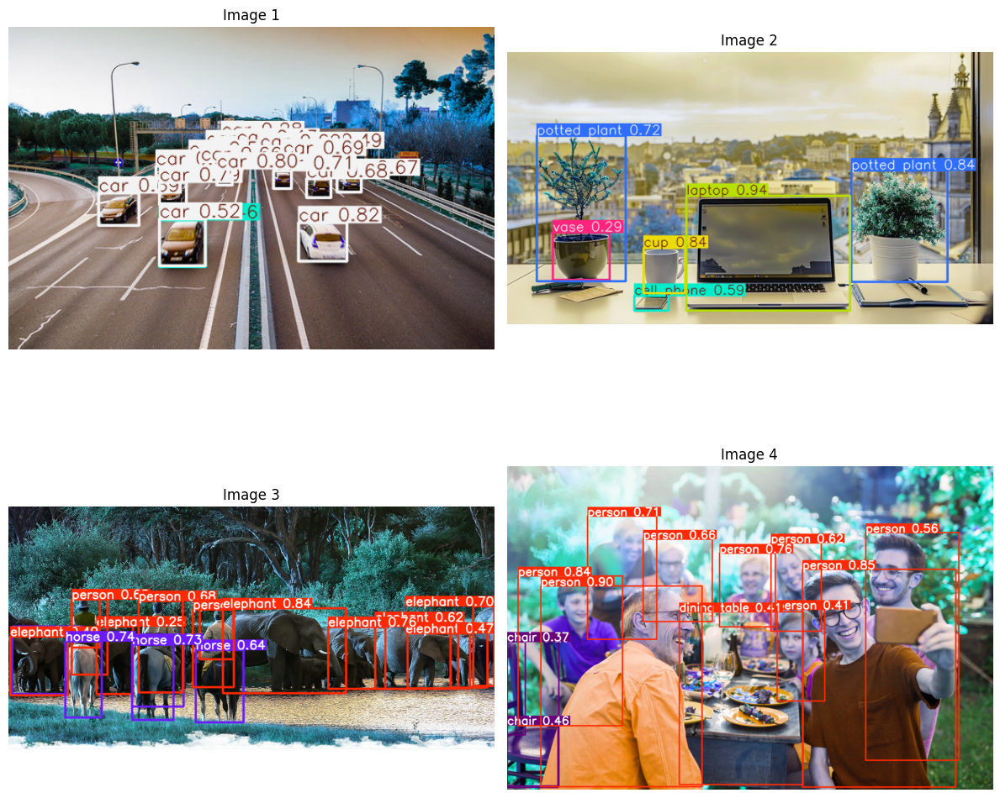

In [23]:
from ultralytics import YOLO  # Import the YOLO model
import cv2
from matplotlib import pyplot as plt

# Load the trained YOLO model
model = YOLO('/content/path/to/your/yolo11n.pt')  # Adjust path as needed

# Define paths to the four images
image_paths = [
    'midtermi-img.jpg',
    'midtermi-img01.jpg',
    'midtermi-img02.jpg',
    'midtermi-img03.jpg'
]  # Adjust paths as needed

# Create a 2x2 subplot for the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))  # Adjust figsize as needed
axes = axes.ravel()  # Flatten the axes array for easy indexing

# Loop over each image path
for i, image_path in enumerate(image_paths):
    # Load each image
    image = cv2.imread(image_path)

    # Verify that the image loaded successfully
    if image is None:
        raise FileNotFoundError(f"Image at path {image_path} not found.")

    # Run object detection
    results = model(image)

    # Get result image with bounding boxes and labels
    result_image = results[0].plot()

    # Display the image on the subplot
    axes[i].imshow(result_image)
    axes[i].axis('off')  # Hide axes for a cleaner look
    axes[i].set_title(f"Image {i+1}")

plt.tight_layout()
plt.show()



In [ ]:
# Validate multiple models
for x in 'nsmlx':
  !yolo val model=yolo11{x}.pt data=coco.yaml

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs
val: Scanning /content/datasets/coco/labels/val2017... 4952 images, 48 backgrounds, 0 corrupt: 100% 5000/5000 [00:20<00:00, 249.39it/s]
val: New cache created: /content/datasets/coco/labels/val2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 313/313 [19:24<00:00,  3.72s/it]
                   all       5000      36335      0.653      0.504      0.549      0.392
                person       2693      10777       0.76      0.676      0.753      0.523
               bicycle        149        314      0.692      0.404      0.478      0.275
                   car        535       1918      0.658       0.53      0.583      0.375
            motorcycle        159        367      0.765      0.599      0.674      0.443
              airplane         97        143      0.803      